# Code for Oscilloscope Version 2 
### Code has been cleaned up to show only interesting events
### Now add Gaussian fits for calculations

# Problems
1. first converter: needs variable timesteps from info file $\rightarrow$ otherwise integrating over it is futile

In [4]:
import pandas as pd
import numpy as np
import scipy as sp
import pyarrow.parquet as pq
import time
import matplotlib.pyplot as plt
import argparse
import csv
import pyarrow as pa 
from scipy.optimize import curve_fit
from scipy.stats import shapiro 
from scipy.signal import find_peaks

In [18]:
### first converter oscilloscope.csv -> cleaned.csv //have to add correct time-step resolution
RESOLUTION = 2e-11
BUFFER_SIZE = 50_000  # number of rows to buffer before writing

def convert_csv_to_csv_and_parquet(in_path, out_csv_path, out_parquet_path):
    buffer = []
    event_id = -1
    t0 = None
    idx = 0

    parquet_writer = None

    with open(in_path) as fin, open(out_csv_path, "w") as fout:
        # write CSV header
        fout.write("event_id,timestamp,Ch_1,Ch_2,Ch_3\n")

        for line in fin:
            line = line.strip()
            if not line:
                continue

            parts = line.split(";")

            # new event
            if len(parts) == 1:
                event_id += 1
                t0 = float(parts[0])
                idx = 0
                continue

            # data row
            if len(parts) == 3:
                timestamp = t0 + idx * RESOLUTION
                idx += 1
                x, y, z = map(float, parts)

                # add to buffer
                buffer.append([event_id, timestamp, x, y, z])

                # flush buffer if full
                if len(buffer) >= BUFFER_SIZE:
                    # write CSV
                    for row in buffer:
                        fout.write(f"{row[0]},{row[1]},{row[2]},{row[3]},{row[4]}\n")

                    # write Parquet
                    df = pd.DataFrame(buffer, columns=["event_id", "timestamp", "Ch_1", "Ch_2", "Ch_3"])
                    table = pa.Table.from_pandas(df)
                    if parquet_writer is None:
                        parquet_writer = pq.ParquetWriter(out_parquet_path, table.schema, compression='snappy')
                    parquet_writer.write_table(table)

                    buffer = []

                continue

            raise ValueError(f"Unexpected format: {line}")

        # flush remaining buffer
        if buffer:
            for row in buffer:
                fout.write(f"{row[0]},{row[1]},{row[2]},{row[3]},{row[4]}\n")
            df = pd.DataFrame(buffer, columns=["event_id", "timestamp", "Ch_1", "Ch_2", "Ch_3"])
            table = pa.Table.from_pandas(df)
            if parquet_writer is None:
                parquet_writer = pq.ParquetWriter(out_parquet_path, table.schema, compression='snappy')
            parquet_writer.write_table(table)

        if parquet_writer:
            parquet_writer.close()

In [6]:
convert_csv_to_csv_and_parquet('/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/Wfm_triggered_on_LaserTrigger_Run2_2025-11-24_0_154158.Wfm.csv', '/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_LaserTrigger_Run1.csv', '/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_LaserTrigger_Run1.parquet')

In [4]:
### analysis of interesting events and ratio to empty events
def load_df(data): # load data no matter if already df or file
    # Case 1: filename 
    if isinstance(data, str):
        df = pd.read_csv(data)   
    
    # Case 2: already a DataFrame 
    elif isinstance(data, pd.DataFrame):
        df = data
    
    else:
        raise TypeError("Input must be a filename or a pandas DataFrame.")
    return df
    

In [20]:
def plot_all_channels(df, target_event = 0):
    # filter for target event
    event= df[df['event_id'] == target_event] 

    # plot
    plt.figure(figsize=(6,2))
    plt.plot(event["timestamp"], event["Ch_1"], label="Laser Trigger")
    plt.plot(event["timestamp"], event["Ch_2"], label="MCP PMT Camera")
    plt.plot(event["timestamp"], event["Ch_3"], label="HPD")
    plt.xlabel("Timestamp (s)")
    plt.ylabel("Signal")
    plt.title(f"Event {target_event}")
    plt.legend()
    plt.show()

In [21]:
def plot_only_camera(df, target_event = 0):
    # filter for target event
    event= df[df['event_id'] == target_event] 

    # plot
    plt.figure(figsize=(6,2))
    plt.plot(event["timestamp"], event["Ch_2"], label="MCP PMT Camera")
    plt.xlabel("Timestamp (s)")
    plt.ylabel("Signal")
    plt.title(f"Event {target_event}")
    plt.legend()
    plt.show()

In [22]:
def interesting_value_filter(df, min_thresh = -0.01):
    # one grouped min over the whole DataFrame
    mins = df.groupby('event_id')['Ch_2'].min()
    # select only those event_ids whose min < threshold
    interesting_ids = mins[mins < min_thresh].index.to_list()
    return interesting_ids

In [23]:
def main_ratio(data, min_thresh = -0.01, show_plots=True):
    '''Usage:
        1. Input of the cleaned file after convert_csv_to_csv_and_parquet
        2. Define acceptable threshold for the minima one wants to accept
       Purpose:
        - takes an oscilloscope dataset and returns the ratio of 
    '''
    df = load_df(data)  # returns df if either pandas dataframe or directly from file
    interesting_ids = interesting_value_filter(df, min_thresh)
    
    ratio = len(interesting_ids)/(max(df['event_id'])+1)
    percentage = ratio * 100
    print(f'There are: {len(interesting_ids)} interesting events, that match the used threshold')
    # print(f'These events are numbered: {interesting_ids}')
    print(f'The percentage of interesting events to empty events is: {percentage:.5f}%')

    if show_plots:
        for i in interesting_ids:
            # plot_all_channels(df, target_event=i)
            plot_only_camera(df, target_event=i)

There are: 161 interesting events, that match the used threshold
The percentage of interesting events to empty events is: 1.60984%


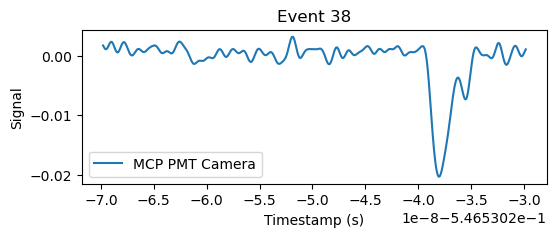

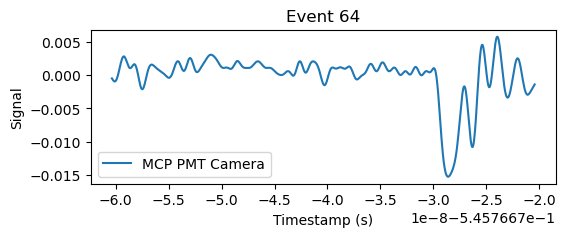

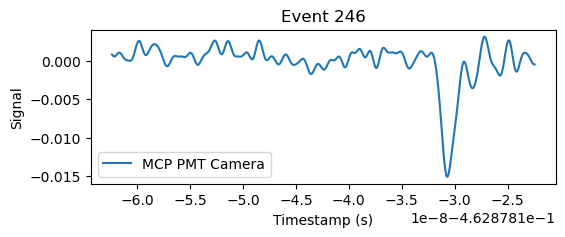

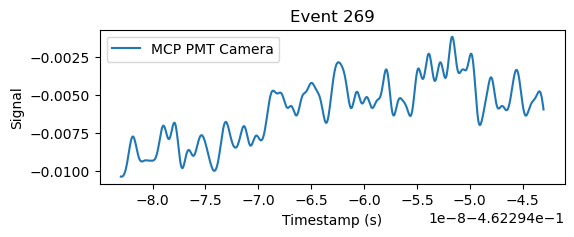

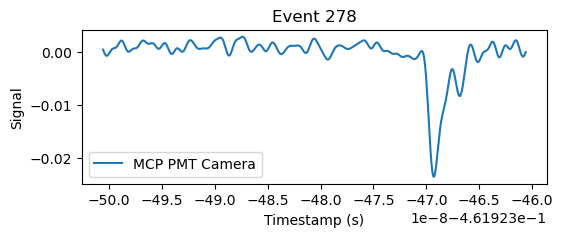

...

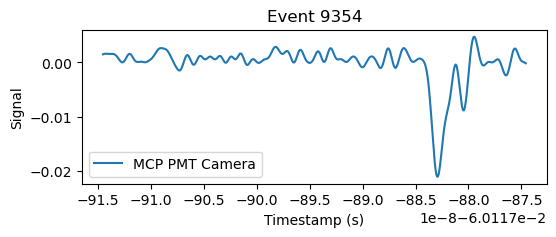

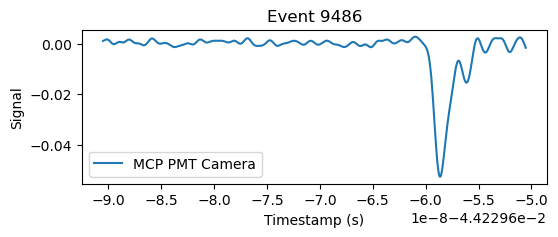

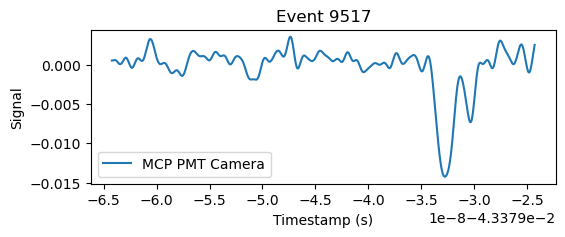

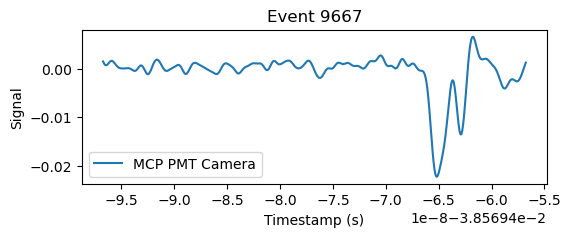

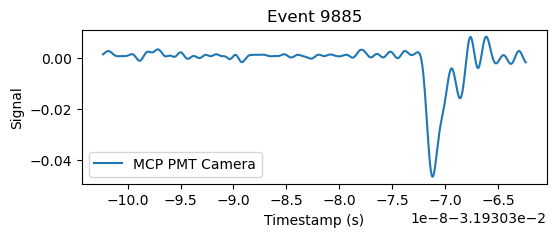

In [21]:
main_ratio('/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_HPD_Run1.csv')

There are: 154 interesting events, that match the used threshold
The percentage of interesting events to empty events is: 1.53985%


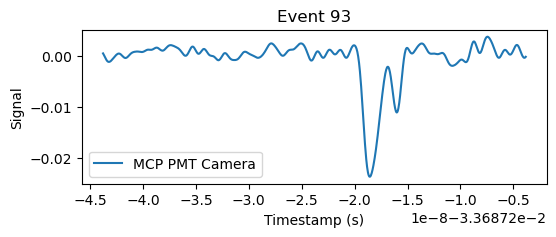

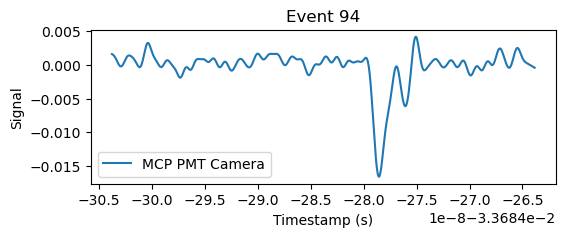

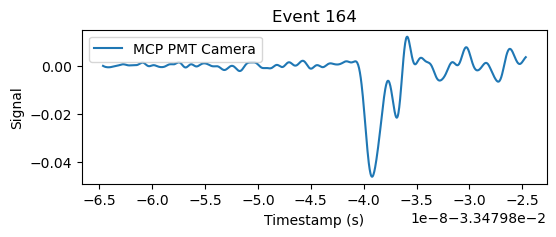

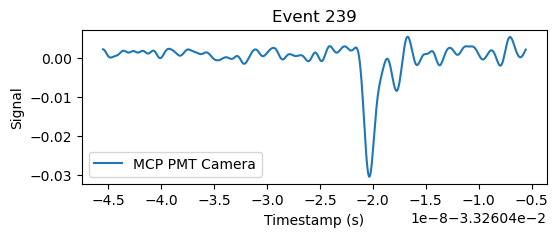

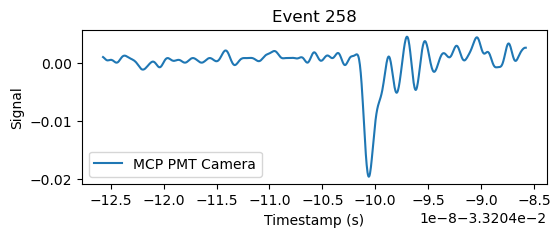

...

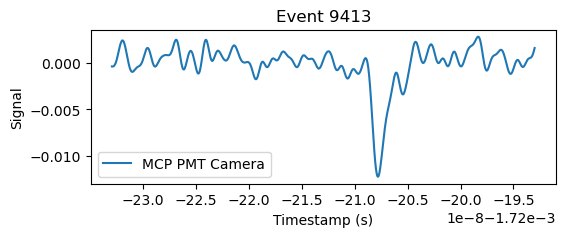

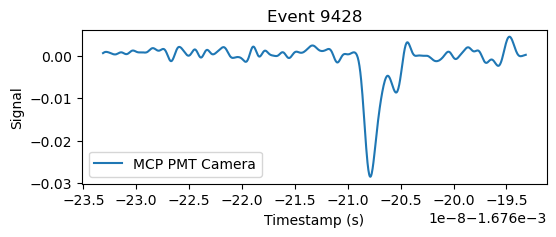

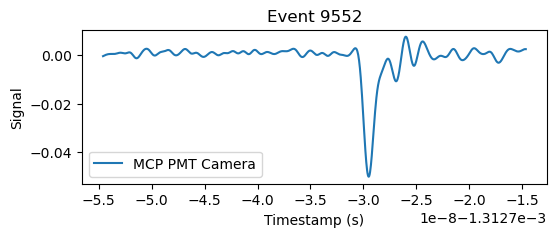

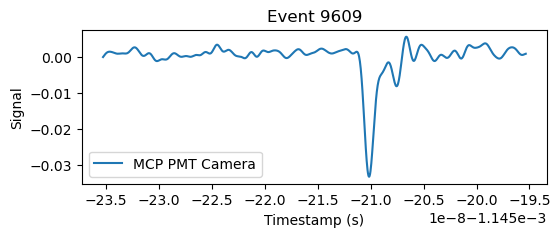

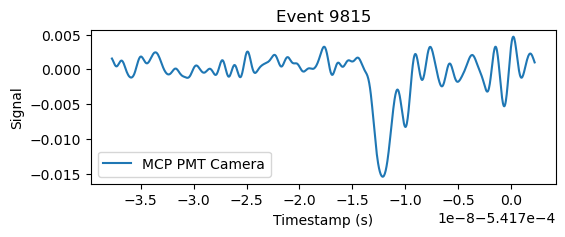

In [22]:
main_ratio('/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_LaserTrigger_Run2.csv')

### Ratio analysis
1. the code for the ratio analysis is thus complete
2. this code can be used to estimate the ratio of interesting to empty events $\rightarrow$ use this to calibrate the light source

#### Caveats:
1. this is only a rough estimate based on few statistics
2. still need continue with the second part of the code $\rightarrow$ calculate area enveloped by pulses to calculate amplification of camera
3. $\textbf{Need to fix the timesteps the first converter uses}$

### Gaussian fit goals:
1. measure time jitters between the peaks
2. compute integral under peak for 

In [10]:
df = pd.read_csv('/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_LaserTrigger_Run2.csv')

In [24]:
def gauss(x, A, mu, sigma, C):
        return A * np.exp(-0.5 * ((x - mu)/sigma)**2) + C

In [25]:
def fit_neg_gaussian_to_event(df, event_id = 0, channel="Ch_2"): # fitting negative gaussians
    event = df[df["event_id"] == event_id].sort_values("timestamp")
    x = event["timestamp"].to_numpy()
    y = event[channel].to_numpy()

    # crude initial guesses
    A0 = y.min() - y.max()
    mu0 = x[np.argmin(y)] if A0 < 0 else x[np.argmax(y)]
    sigma0 = (x.max() - x.min()) / 10
    C0 = np.median(y)

    p0 = [A0, mu0, sigma0, C0]
    popt, pcov = curve_fit(gauss, x, y, p0=p0)
    return x, y, popt, pcov

In [26]:
def fit_pos_gaussian_to_event(df, event_id = 0, channel="Ch_1"):  # fitting positive gaussians
    event = df[df["event_id"] == event_id].sort_values("timestamp")
    x = event["timestamp"].to_numpy()
    y = event[channel].to_numpy()

    # crude initial guesses
    A0 = y.max() - y.min()
    mu0 = x[np.argmin(y)] if A0 < 0 else x[np.argmax(y)]
    sigma0 = (x.max() - x.min()) / 10
    C0 = np.median(y)

    p0 = [A0, mu0, sigma0, C0]
    popt, pcov = curve_fit(gauss, x, y, p0=p0)
    return x, y, popt, pcov

In [27]:
def plot_event_with_gaussian(df, event_id = 0, channel="Ch_2"): # plotting fitted data
    x, y, popt, pcov = fit_neg_gaussian_to_event(df, event_id, channel=channel)
    x_fit = x
    y_fit = gauss(x_fit, *popt)

    plt.figure(figsize=(6, 3))
    plt.plot(x, y, "o", ms=2, label=f"Data {channel}")
    plt.plot(x_fit, y_fit, "-", label="Gaussian fit")
    plt.xlabel("Timestamp (s)")
    plt.ylabel("Signal")
    plt.title(f"Event {event_id} – Gaussian fit")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [28]:
def main_gauss_plots(data, min_thresh = -0.01, show_plots=True): # load data, filter interesting ids, fit and plot gaussians
    '''Usage:
        1. Input of the cleaned file after convert_csv_to_csv_and_parquet
        2. Define acceptable threshold for the minima one wants to accept
       Purpose:
        - takes an oscilloscope dataset and returns the ratio of 
    '''
    df = load_df(data)  # returns df if either pandas dataframe or directly from file
    interesting_ids = interesting_value_filter(df, min_thresh)

    for i in interesting_ids:
        plot_event_with_gaussian(df, event_id = i)

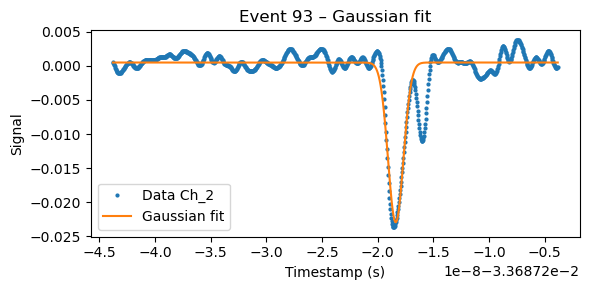

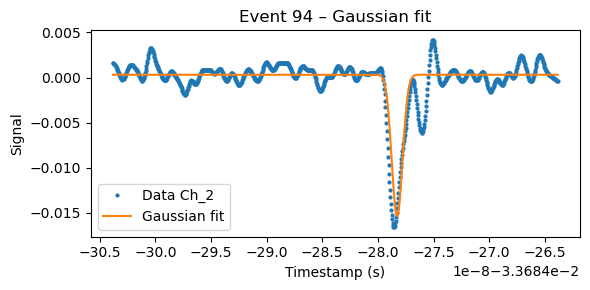

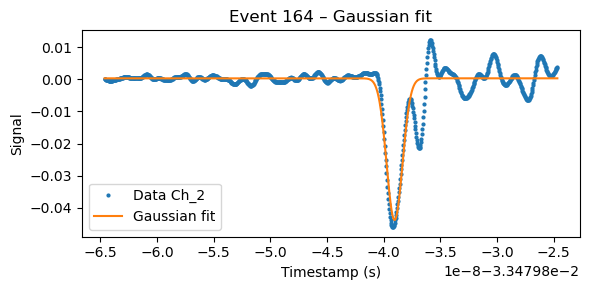

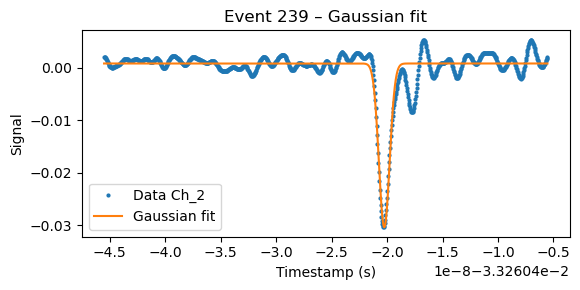

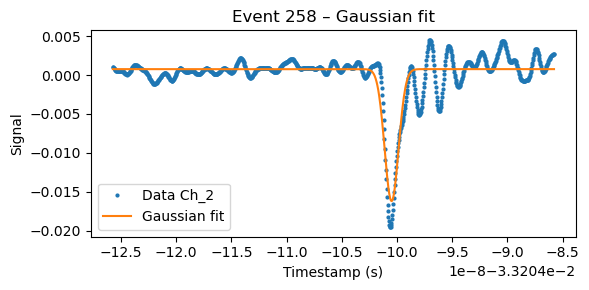

...

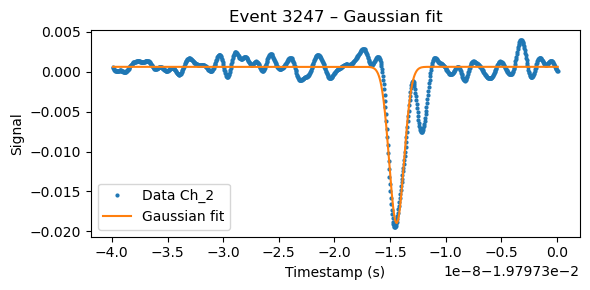

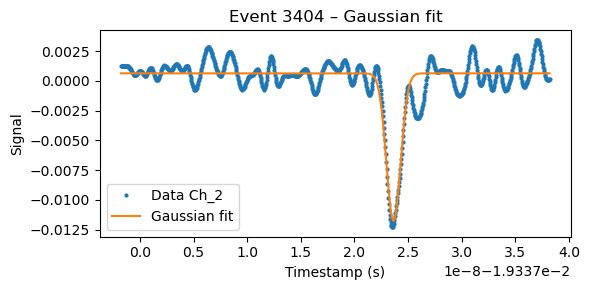

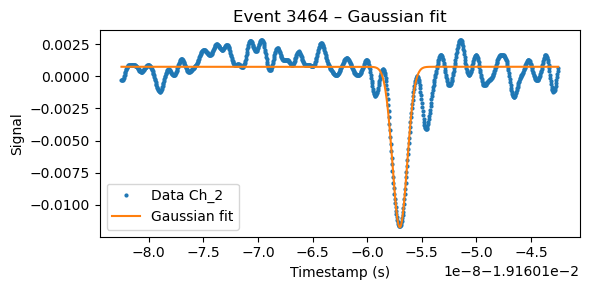

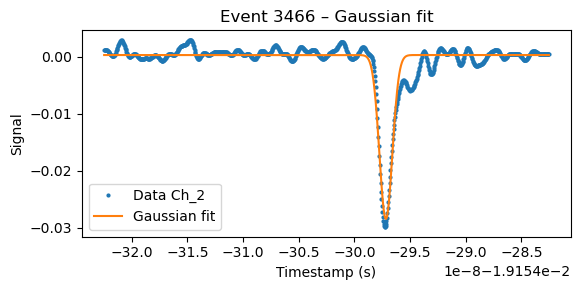

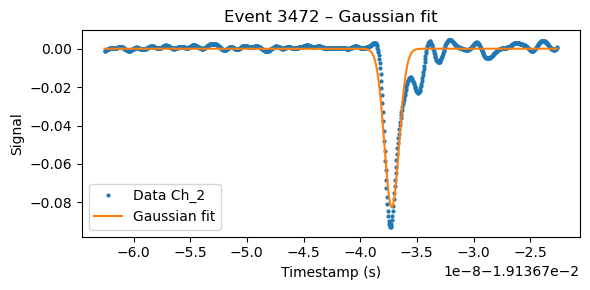

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

In [13]:
main_gauss_plots(df)  # fitting timed out for event 3565 (which is in fact not gaussian)

### Commentary:
- the Gaussian fits aren't ideal for real calculations -> jitter should work well, $\textcolor{red}{\text{but}}$ gaussian is probably not the best idea for the integration

### 2nd phase of code
1. add second stage for interesting events -> remove signals that match amplitude but not the form/position -> removing position should ne enough -> $\textcolor{red}{\text{problem}}$ this is not universally applicable -> different positions for different data -> ignored for the moment
1. calculate jitter time between camera and laser trigger -> using peaks package
2. for jitter calculation -> old code with FWHM jitter timing? or simply create list between peak time differences? -> both

## Coding the timing jitter function:
#### Dependencies:
1. load_df
2. interesting_ids
3. peaks from scipy


In [29]:
def peak_time_from_trace(t, y, height=None, prominence=None):  # calculates peak timing using find_peaks from scipy
    peaks, props = find_peaks(y, height=height, prominence=prominence)
    if len(peaks) == 0:
        return None  # or raise
    # choose the highest / most prominent peak
    i = peaks[np.argmin(props["peak_heights"])]
    return t[i]

In [46]:
df_HPD = pd.read_csv('/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_LaserTrigger_Run2.csv')

In [47]:
int_ids = interesting_value_filter(df_HPD)    

In [48]:
def cf_pos_pulse_time(t, y, frac=0.7): # time pickoff via constant-fraction for one event
    """
    Constant-fraction time pickoff.
    Assumes a positive pulse on top of baseline-subtracted data.
    """
    A = y.max()
    if A <= 0:
        return None
    thr = frac * A

    idx = np.where(y >= thr)[0]
    if len(idx) == 0:
        return None
    i1 = idx[0]
    if i1 == 0:
        return t[0]
    i0 = i1 - 1

    t0, t1 = t[i0], t[i1]
    y0, y1 = y[i0], y[i1]
    if y1 == y0:
        return t1  # fallback
    # linear interpolation
    return t0 + (thr - y0) * (t1 - t0) / (y1 - y0)


In [49]:
def cf_neg_pulse_time(t, y, frac=0.9):  # calculates the first element idx that is above the thresh 
    """
    Constant-fraction time pickoff. 
    Assumes a negative pulse on top of baseline-subtracted data.
    """
    A = y.min()
    if A >= 0:
        return None
    thr = frac * A # calculates max Amplitude A and determines the thresh based on A 

    idx = np.where(y <= thr)[0] # selects first index where y is above thresh -> timing based on first flank
    if len(idx) == 0:
        return None
        
    i1 = idx[0] # renaming
    if i1 == 0:
        return t[0]
        
    i0 = i1 - 1 # shifting by one index for linear interepolation

    t0, t1 = t[i0], t[i1]
    y0, y1 = y[i0], y[i1]
    if y1 == y0:
        return t1  # fallback
    # linear interpolation for values that satisfy threshold
    return t0 + (thr - y0) * (t1 - t0) / (y1 - y0)


In [50]:
channel = 'Ch_2'
t = df['timestamp'][df['event_id'] == 93].to_numpy()   # checking cf_neg_pulse_time function for event 93
y = df[channel][df['event_id'] == 93].to_numpy()

print(cf_neg_pulse_time(t,y))

-0.033687231317456066


In [51]:
# -0.0336872168649609 was the value in find-peaks

In [52]:
def subtract_baseline(t, y, t_pre_max=None):
    """
    Subtract baseline estimated from pre-signal region.
    If t_pre_max is None, use first 10% of the time window.
    """
    if t_pre_max is None:
        t_pre_max = t.min() + 0.1 * (t.max() - t.min())
    mask_pre = t < t_pre_max
    if not np.any(mask_pre):
        baseline = np.median(y)
    else:
        baseline = np.median(y[mask_pre])
    return y - baseline, baseline

In [53]:
def event_time_diff(event_df, ch_ref="Ch_1", ch_test="Ch_2",
                    frac=0.9, t_pre_max=None):
    """
    Compute t_test - t_ref for a single event DataFrame.
    Returns None if timing cannot be determined.
    """
    t = event_df["timestamp"].to_numpy()

    y_ref = event_df[ch_ref].to_numpy()
    y_ref_bs, _ = subtract_baseline(t, y_ref, t_pre_max)
    t_ref = cf_pos_pulse_time(t, y_ref_bs, frac=frac)

    y_test = event_df[ch_test].to_numpy()
    y_test_bs, _ = subtract_baseline(t, y_test, t_pre_max)
    t_test = cf_neg_pulse_time(t, y_test_bs, frac=frac)

    if t_ref is None or t_test is None:
        return None
    return t_test - t_ref


In [54]:
event_df = df[df['event_id'] == 93]

In [55]:
event_time_diff(event_df)

np.float64(4.007091269908614e-09)

In [14]:
def compute_jitter(df, ch_ref="Ch_1", ch_test="Ch_2",
                   frac=0.5, t_pre_max=None):
    """
    Loop over all event_id in df, compute time differences (test - ref),
    and return the list of deltas plus mean and std (jitter).
    """
    deltas = []
    for eid in df["event_id"].unique():
        event = df[df["event_id"] == eid].sort_values("timestamp")
        dt = event_time_diff(event, ch_ref=ch_ref, ch_test=ch_test,
                             frac=frac, t_pre_max=t_pre_max)
        if dt is not None:
            deltas.append(dt)

    deltas = np.array(deltas)
    if len(deltas) == 0:
        return deltas, None, None

    mean_offset = deltas.mean()
    jitter = deltas.std(ddof=1)  # RMS jitter
    return deltas, mean_offset, jitter


In [57]:
def plot_jitter_histogram(deltas, bins=200):  # plot of the jitter distribution
    plt.figure(figsize=(5, 3))
    plt.hist(deltas * 1e12, bins=bins, alpha=0.8, edgecolor="k")  # example: ps
    plt.xlabel("Time difference (ps)")
    plt.ylabel("Counts")
    plt.title("Jitter distribution")
    plt.tight_layout()
    plt.show()

def plot_jitter_vs_event(deltas):  # if one wishes to find the deviating events
    plt.figure(figsize=(5, 3))
    plt.plot(np.arange(len(deltas)), deltas * 1e12, ".", ms=3)
    plt.xlabel("Event index")
    plt.ylabel("Time difference (ps)")
    plt.title("Jitter vs event")
    plt.tight_layout()
    plt.show()

In [58]:
int_df = df[df['event_id'].isin(int_ids)]
deltas, mean_offset, jitter = compute_jitter(int_df)

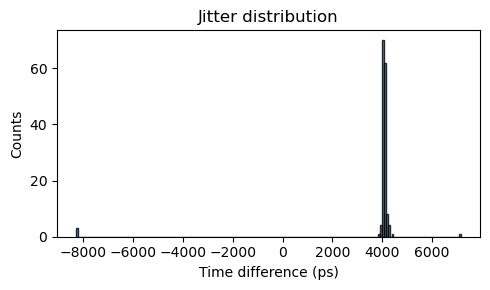

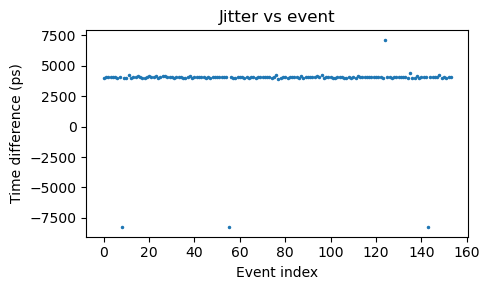

In [59]:
plot_jitter_histogram(deltas)
plot_jitter_vs_event(deltas)

In [60]:
def fwhm_from_hist(deltas, bins=100, range=None, frac=0.5):
    counts, bin_edges = np.histogram(deltas, bins=bins, range=range)
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    max_count = counts.max()
    if max_count == 0:
        return None, None, None, None, None

    # peak center (mode) as max-count bin center
    peak_idx = np.argmax(counts)
    peak_center = bin_centers[peak_idx]

    half_max = frac * max_count
    above = np.where(counts >= half_max)[0]
    if len(above) < 2:
        return None, None, None, None, peak_center

    left = bin_centers[above[0]]
    right = bin_centers[above[-1]]
    fwhm = right - left
    return fwhm, left, right, half_max, peak_center

def plot_jitter_histograms_with_zoom(deltas, bins=80, unit_scale=1e12, unit_label="ps", zoom_factor=2.0):
    """
    Plots:
      1) Full jitter histogram with FWHM
      2) Zoomed-in histogram around the peak (± zoom_factor * FWHM / 2)
    """
    # FWHM in seconds
    fwhm_s, left_s, right_s, half_max, peak_s = fwhm_from_hist(deltas, bins=bins)
    if fwhm_s is None:
        print("Could not determine FWHM for jitter.")
        return

    # convert to plotting units
    deltas_u = deltas * unit_scale
    fwhm_u = fwhm_s * unit_scale
    left_u = left_s * unit_scale
    right_u = right_s * unit_scale
    peak_u = peak_s * unit_scale

    # ---------- 1) Full histogram ----------
    plt.figure(figsize=(5, 3))
    plt.hist(deltas_u, bins=bins, alpha=0.8, edgecolor="k")
    plt.xlabel(f"Time difference ({unit_label})")
    plt.ylabel("Counts")
    plt.title("Jitter distribution (full)")

    plt.axvline(left_u, color="red", linestyle="--", label="FWHM edges")
    plt.axvline(right_u, color="red", linestyle="--")
    plt.text(0.05, 0.95,
             f"FWHM ≈ {fwhm_u:.2f} {unit_label}",
             transform=plt.gca().transAxes,
             va="top", ha="left", color="red")

    plt.tight_layout()
    plt.legend()
    plt.show()

    # ---------- 2) Zoomed histogram ----------
    half_width_u = (fwhm_u / 2) * zoom_factor
    x_min = peak_u - half_width_u
    x_max = peak_u + half_width_u

    plt.figure(figsize=(5, 3))
    plt.hist(deltas_u, bins=bins, alpha=0.8, edgecolor="k")
    plt.xlabel(f"Time difference ({unit_label})")
    plt.ylabel("Counts")
    plt.title("Jitter distribution (zoomed)")
    plt.xlim(x_min, x_max)

    plt.axvline(left_u, color="red", linestyle="--", label="FWHM edges")
    plt.axvline(right_u, color="red", linestyle="--")
    plt.text(0.05, 0.95,
             f"FWHM ≈ {fwhm_u:.2f} {unit_label}",
             transform=plt.gca().transAxes,
             va="top", ha="left", color="red")

    plt.tight_layout()
    plt.legend()
    plt.show()


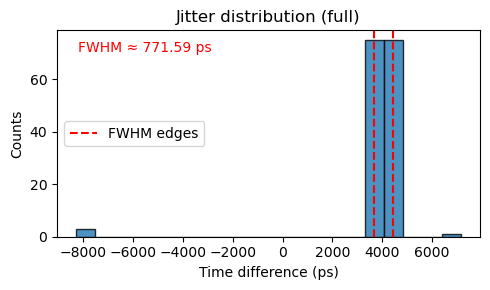

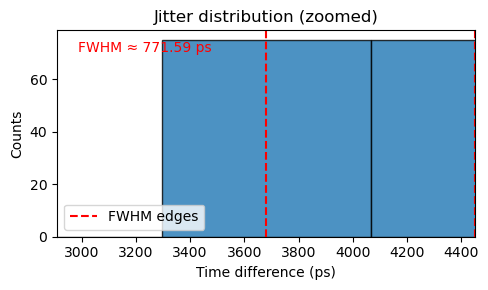

In [61]:
deltas, mean_offset, jitter = compute_jitter(int_df)
plot_jitter_histograms_with_zoom(deltas, bins=20, unit_scale=1e12, unit_label="ps", zoom_factor=2.0)

In [20]:
def main_jitter_plot_and_fwhm(data, bins = 20):
    df = load_df(data)
    int_ids = interesting_value_filter(df)

    int_df = df[df['event_id'].isin(int_ids)]
    deltas, mean_offset, jitter = compute_jitter(int_df)
   
    plot_jitter_histogram(deltas)
    plot_jitter_vs_event(deltas)
    plot_jitter_histograms_with_zoom(deltas, bins=bins, unit_scale=1e12, unit_label="ps", zoom_factor=2.0)

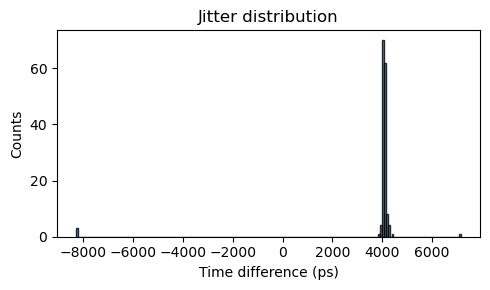

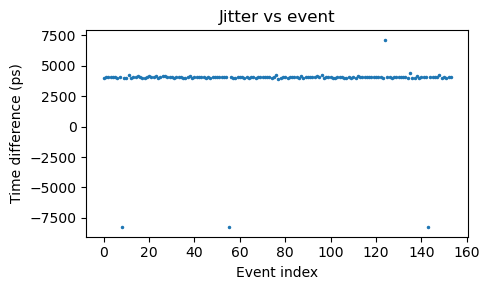

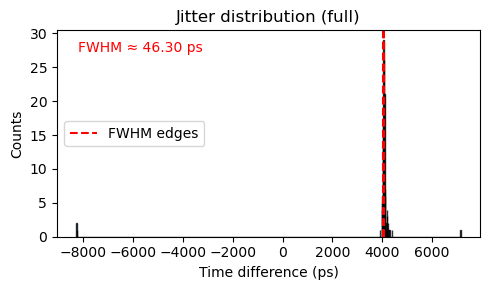

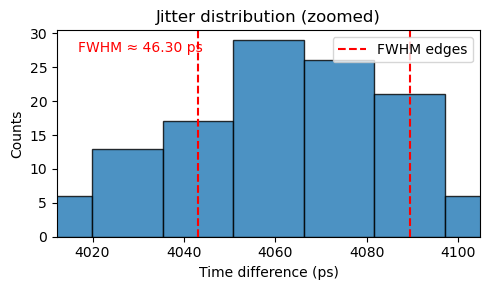

In [63]:
main_jitter_plot_and_fwhm('/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_LaserTrigger_Run2.csv', bins = 1000)

In [64]:
main_jitter_plot_and_fwhm('/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_HPD_Run1.csv', bins = 50)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_HPD_Run1.csv'

### Now integral code for area under pulse

In [66]:
def integrate_pulse(t, y, t_start, t_end):
    """
    Numerical integral of y(t) between t_start and t_end (trapezoidal rule).
    For negative pulses on baseline-subtracted data this area will be negative.
    """
    mask = (t >= t_start) & (t <= t_end)
    if not np.any(mask):
        return 0.0
    return np.trapezoid(y[mask], t[mask])  # V * s if y in V and t in s

In [67]:
def adaptive_window_negative(t, y, frac_level=0.1):
    """
    Find start/end of a negative pulse where it crosses a fraction of its depth.
    frac_level is fraction of |min|, e.g. 0.1 = 10% depth.
    """
    A = y.min()
    if A >= 0:
        return None, None
    thr = frac_level * A  # negative

    # indices where pulse is below this threshold
    idx = np.where(y <= thr)[0]
    if len(idx) == 0:
        return None, None

    i_start = idx[0]
    i_end = idx[-1]
    return t[i_start], t[i_end]

In [68]:
def event_charge_negative_adaptive(event_df, channel="Ch_2",
                                   cf_frac=0.5,
                                   level_frac=0.1,
                                   t_pre_max=None):
    """
    Baseline-subtract, locate negative pulse, then integrate over an
    amplitude-adaptive window (where |y| > level_frac * |min|).
    """
    t = event_df["timestamp"].to_numpy()
    y = event_df[channel].to_numpy()

    y_bs, baseline = subtract_baseline(t, y, t_pre_max=t_pre_max)

    # ensure a pulse exists
    if y_bs.min() >= 0:
        return None

    # use adaptive window from fraction-of-depth
    t_start, t_end = adaptive_window_negative(t, y_bs, frac_level=level_frac)
    if t_start is None:
        return None

    area = integrate_pulse(t, y_bs, t_start, t_end)
    return abs(area)  # V·time

In [69]:
df = pd.read_csv('/Users/laloscola/Desktop/Max-Planck/Extreme Pro SSD data/magic data laboratory/cleaned_triggered_on_LaserTrigger_Run2.csv')

In [70]:
int_ids = interesting_value_filter(df)

In [71]:
int_df = df[df['event_id'].isin(int_ids)]

In [72]:
charges = []
for eid in int_df["event_id"].unique():
    event = int_df[int_df["event_id"] == eid].sort_values("timestamp")
    q = event_charge_negative_adaptive(event, channel="Ch_2", cf_frac = 0.7, level_frac=0.5)
    if q is not None:
        charges.append(q)


In [73]:
print(charges)

[np.float64(1.5371109176949706e-11), np.float64(9.318367024481781e-12), np.float64(2.839050150156593e-11), np.float64(1.4447628407911319e-11), np.float64(9.047307374669494e-12), np.float64(9.431447576638874e-12), np.float64(9.854866665349204e-12), np.float64(3.5332141506525635e-11), np.float64(1.4657671061538332e-11), np.float64(1.7715662055615163e-11), np.float64(5.0038224202561564e-11), np.float64(2.414735667561406e-11), np.float64(1.7454916052609132e-11), np.float64(2.8586771189496834e-11), np.float64(9.17145502385833e-11), np.float64(4.4065402515428316e-11), np.float64(1.2602704929177975e-11), np.float64(1.459331788294371e-11), np.float64(1.0568800335197531e-11), np.float64(1.5204113080609884e-11), np.float64(2.8470602696884132e-11), np.float64(9.9331768476764e-12), np.float64(1.693922946260078e-11), np.float64(1.3509510992796069e-11), np.float64(8.798417956648127e-12), np.float64(3.443429158402504e-11), np.float64(1.527439481189656e-11), np.float64(1.3430026958137675e-11), np.floa

In [74]:
print(f'{np.mean(charges)*1e12} V*ns')

18.444952422260013 V*ns


Text(0.5, 1.0, 'Area under Pulse V*s')

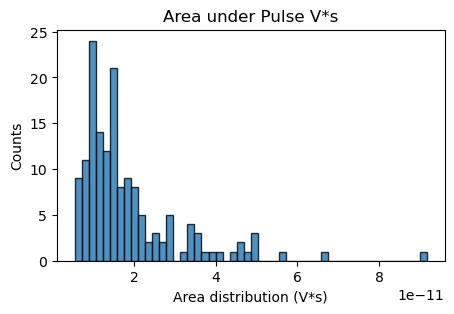

In [75]:
plt.figure(figsize=(5, 3))
plt.hist(charges, bins=50, alpha=0.8, edgecolor="k")
plt.xlabel(f"Area distribution (V*s)")
plt.ylabel("Counts")
plt.title("Area under Pulse V*s")